# **Golf Swing Sequencing Analysis (2023 Revised)**
by Karit Sookpreedee

**Part 2**

This part requires `Tensorflow`.

*The objectives of this part are:*
1. Plot a skeleton (pose estimation) on every 8 frames obtained from Part 1
2. Get angles and confidence values for each event. (as a .csv file)
3. Get difference and score values for each event. (as a .csv file) and calculate the Similarity Score
4. Calculate the Cosine Similarity Score
5. Plot specific joints to visualise some bad joints

All outputs from this part will be inside the `Output` folder.

<img src="./Information/Deep Learning Based Golf Swing Sequencing Analysis Program Overview.png" alt="PNG Image" />

# 0. Import libraries and set up

Import libraries:

In [2]:
import tensorflow as tf
import pandas as pd
import numpy as np
import seaborn as sns
from numpy.linalg import norm
import matplotlib
from matplotlib import pyplot as plt
import matplotlib.pyplot as plt
import matplotlib as mpl
import cv2
import imageio
from IPython.display import HTML, display
import math
import os
import shutil
from sklearn.metrics.pairwise import cosine_similarity
from PIL import Image

Set up the correct path of the model:

In [3]:
interpreter = tf.lite.Interpreter(model_path='lite-model_movenet_singlepose_thunder_3.tflite')
interpreter.allocate_tensors()

INFO: Created TensorFlow Lite XNNPACK delegate for CPU.


Define important parameters and functions:

In [4]:
event_names = {
    0: 'Address',
    1: 'Toe-up',
    2: 'Mid-backswing',
    3: 'Top',
    4: 'Mid-downswing',
    5: 'Impact',
    6: 'Mid-follow-through',
    7: 'Finish'
}

event_names_list = [
    'Address (0)',
    'Toe-up (1)',
    'Mid-backswing (2)',
    'Top (3)',
    'Mid-downswing (4)',
    'Impact (5)',
    'Mid-follow-through (6)',
    'Finish (7)'
]

EDGES = {
    (0, 1): 'm',
    (0, 2): 'c',
    (1, 3): 'm',
    (2, 4): 'c',
    (0, 5): 'm',
    (0, 6): 'c',
    (5, 7): 'm',
    (7, 9): 'm',
    (6, 8): 'c',
    (8, 10): 'c',
    (5, 6): 'y',
    (5, 11): 'm',
    (6, 12): 'c',
    (11, 12): 'y',
    (11, 13): 'm',
    (13, 15): 'm',
    (12, 14): 'c',
    (14, 16): 'c'
}

angle = [[5,0,6],[6,0,5],[5,0,7],[6,0,8],[5,6,11],[6,5,12],[5,7,11],[6,8,12],[7,5,9],[8,6,10],[11,5,12],
        [12,6,11],[11,5,13],[12,6,14],[11,12,13],[12,11,14],[13,11,15],[14,12,16]]

connection1 = [0,0,1,2,0,0,6,6,8,5,7,6,5,12,12,14,11,13]

connection2 = [1,2,3,4,6,5,5,8,10,7,9,12,11,11,14,16,13,15]

confidence_threshold = 0.1

def draw_keypoints(frame, keypoints, confidence_threshold):
    y, x, c = frame.shape
    shaped = np.squeeze(np.multiply(keypoints, [y,x,1]))
    
    for kp in shaped:
        ky, kx, kp_conf = kp
        if kp_conf > confidence_threshold:
            cv2.circle(frame, (int(kx), int(ky)), 4, (0,255,0), -1)
    return None

def draw_connections(frame, keypoints, edges, confidence_threshold):
    y, x, c = frame.shape
    shaped = np.squeeze(np.multiply(keypoints, [y,x,1]))
    
    for edge, color in edges.items():
        p1, p2 = edge
        y1, x1, c1 = shaped[p1]
        y2, x2, c2 = shaped[p2]
        
        if (c1 > confidence_threshold) & (c2 > confidence_threshold):      
            cv2.line(frame, (int(x1), int(y1)), (int(x2), int(y2)), (0,0,255), 6)
    return None

def main(x,confidence_threshold):
    cap = cv2.VideoCapture(x)
    all_keypoints_in_all_frames_list = []
    while cap.isOpened():
        ret, frame = cap.read()
        if frame is None:
            break
        img = frame.copy()
        height = img.shape[0]
        width = img.shape[1]

        # Reshape image
        img = tf.image.resize_with_pad(np.expand_dims(img, axis=0), 256,256)
        input_image = tf.cast(img, dtype=tf.float32)

        # Setup input and output 
        input_details = interpreter.get_input_details()
        output_details = interpreter.get_output_details()

        # Make predictions 
        interpreter.set_tensor(input_details[0]['index'], np.array(input_image))
        interpreter.invoke()
        keypoints_with_scores = interpreter.get_tensor(output_details[0]['index'])
        all_keypoints_in_all_frames_list.append(keypoints_with_scores[0][0].tolist())

        # Rendering 
        draw_connections(frame, keypoints_with_scores, EDGES, confidence_threshold)
        draw_keypoints(frame, keypoints_with_scores, confidence_threshold)
        
    cap.release()
    return keypoints_with_scores, height, width

def main_for_vdo(x,confidence_threshold):
    cap = cv2.VideoCapture(x)
    while cap.isOpened():
        ret, frame = cap.read()
        if frame is None:
            break
        img = frame.copy()
        height = img.shape[0]
        width = img.shape[1]

        # Reshape image
        img = tf.image.resize_with_pad(np.expand_dims(img, axis=0), 256,256)
        input_image = tf.cast(img, dtype=tf.float32)

        # Setup input and output 
        input_details = interpreter.get_input_details()
        output_details = interpreter.get_output_details()

        # Make predictions 
        interpreter.set_tensor(input_details[0]['index'], np.array(input_image))
        interpreter.invoke()
        keypoints_with_scores = interpreter.get_tensor(output_details[0]['index'])

        # Rendering 
        draw_connections(frame, keypoints_with_scores, EDGES, confidence_threshold)
        draw_keypoints(frame, keypoints_with_scores, confidence_threshold)

        cv2.imshow('MoveNet Lightning', frame)

        if cv2.waitKey(10) & 0xFF==ord('q'):
            break
        
    cap.release()
    cv2.destroyAllWindows()
    return None

def get_coor_list(keypoints_with_scores,height,width):
    x = []
    y = []
    keypoints_confidence_list = []
    for i in range(17):
        t = np.array(keypoints_with_scores[0][0][i][:2]*[height,width]).astype(int)
        keypoints_confidence_list.append(keypoints_with_scores[0][0][i][2])
        x.append(t[1])
        y.append(t[0])

    coor_list = []
    for i in range(17):
        coor_list.append((x[i],y[i]))
    return coor_list, x, y, keypoints_confidence_list

def get_angle(coor_list,c,a,b):
    cx = coor_list[c][0]
    cy = coor_list[c][1]
    ax = coor_list[a][0] - cx
    ay = coor_list[a][1] - cy
    bx = coor_list[b][0] - cx
    by = coor_list[b][1] - cy
    dot = ax*bx + ay*by
    norm_a = math.sqrt(ax**2 + ay**2)
    norm_b = math.sqrt(bx**2 + by**2)
    
    if norm_a*norm_b != 0:
        dum = dot/(norm_a*norm_b)
        if -1 <= dum <= 1:
            degree = math.degrees(math.acos(dot/(norm_a*norm_b)))
        else: 
            degree = math.nan
    else: 
        degree = math.nan
    return round(degree,2)

def get_angle_list(coor_list):
    angle_list = []
    for i in range(len(angle)):
        angle_list.append(get_angle(coor_list,angle[i][0],angle[i][1],angle[i][2]))
    return angle_list

def plot_in_matplotlib(x, y, file_name, output_folder, output_name):
    # Load image from file
    im = plt.imread(file_name)
    implot = plt.imshow(im)
    
    # Plot connections
    for i in range(len(connection1)):
        plt.plot([x[connection1[i]], x[connection2[i]]], [y[connection1[i]], y[connection2[i]]], '-', color="red", linewidth=1)

    # Plot points
    x_arr = np.array(x)
    y_arr = np.array(y)
    plt.scatter(x_arr, y_arr, s=10)

    # Annotate points
    for i in range(17):
        plt.annotate(f"{i}", (x[i], y[i]), color='white', size='5')

    # Remove axis
    plt.axis('off')
    
    # Save figure
    output_path = os.path.join(output_folder, output_name)
    plt.savefig(output_path, bbox_inches="tight", transparent=True, facecolor="w", edgecolor='w', orientation='landscape')
    
    # Display plot
    plt.show()
    
def get_angles_confidence_list(keypoints_confidence_list):
    global angle
    angles_confidence_list = []
#     print('keypoints_confidence_list=',keypoints_confidence_list)
    for ang in angle:
        c = 0
        for ang_number in ang:
            c += keypoints_confidence_list[ang_number]
        conf_val = "{:.2f}".format(c/3)
        angles_confidence_list.append(conf_val)
    return angles_confidence_list

def get_angle_and_conf(file_name_list,confidence_threshold): 
    frame_arr = np.zeros((36,), dtype=int)
    for i in range(len(file_name_list)):

        keypoints_with_scores, height, width = main(file_name_list[i],confidence_threshold)
        coor_list, x, y, keypoints_confidence_list = get_coor_list(keypoints_with_scores,height,width)

        angles_list = get_angle_list(coor_list)
        angles_confidence_list = get_angles_confidence_list(keypoints_confidence_list)
#         print(angles_confidence_list)
        frame_row_list = angles_list + angles_confidence_list
        frame_row_dum = np.array(frame_row_list)
        frame_arr = np.vstack([frame_arr, frame_row_dum])    
    frame_arr = np.delete(frame_arr, 0, 0)
    return frame_arr.astype(float)

def plot_images_from_folders(folder1, folder2):

    # Get list of image paths
    images_folder1 = [os.path.join(folder1, f) for f in sorted(os.listdir(folder1)) if f.endswith(('.png', '.jpg', '.jpeg'))]
    images_folder2 = [os.path.join(folder2, f) for f in sorted(os.listdir(folder2)) if f.endswith(('.png', '.jpg', '.jpeg'))]

    # Ensure both folders have 8 images
    assert len(images_folder1) == 8, "Folder 1 does not contain exactly 8 images."
    assert len(images_folder2) == 8, "Folder 2 does not contain exactly 8 images."

    # Create subplots
    fig, axes = plt.subplots(nrows=8, ncols=2, figsize=(10, 50))

    # Plot images
    for i in range(8):
        # Load images
        img1 = Image.open(images_folder1[i])
        img2 = Image.open(images_folder2[i])
        
        # Display images
        axes[i, 0].imshow(img1)
        axes[i, 1].imshow(img2)
        
        # Remove axes for a cleaner look
        axes[i, 0].axis('off')
        axes[i, 1].axis('off')

    # Adjust spacing between subplots
    plt.subplots_adjust(wspace=0.01, hspace=0.1)
    plt.show()

def get_sorted_file_list(folder_path):
    file_list = os.listdir(folder_path)
    file_list.sort()
    if '.DS_Store' in file_list:
        file_list.remove('.DS_Store')
    return [os.path.join(folder_path, file) for file in file_list]

Outputs from part 1:

In [5]:
folder_with_frames_path_pro = "Outputs/8frames_pro"
folder_with_frames_path_newbie = "Outputs/8frames_newbie"

# 1. Plot skeleton

MoveNet plots the skeleton (pose estimation) on the subject body of each frame.

Define functions:

In [6]:
def plot_skeleton(file_list, destination_folder, confidence_threshold):
    for i, file_path in enumerate(file_list):
        keypoints_with_scores, height, width = main(file_path, confidence_threshold)
        coor_list, x, y, confidence_list = get_coor_list(keypoints_with_scores, height, width)
        output_name = f"skeleton_{i}.jpg"
        plot_in_matplotlib(x, y, file_path, destination_folder, output_name)

## Plot skeleton: Pro

Input (Pro):

In [7]:
destination_folder_path_pro = "Outputs/skeletons_pro"

Output (Pro):

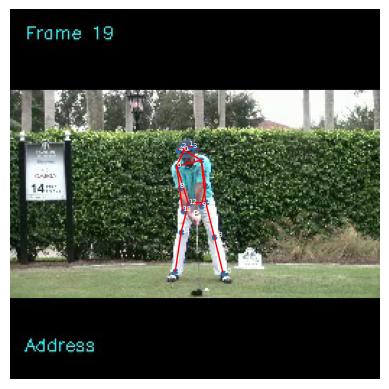

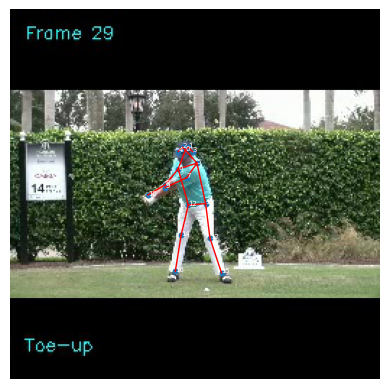

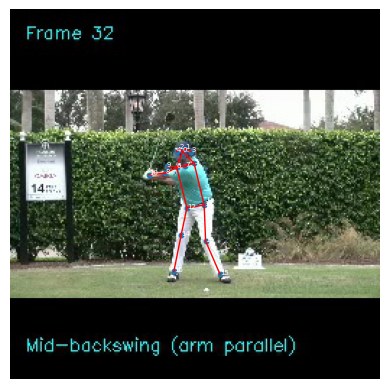

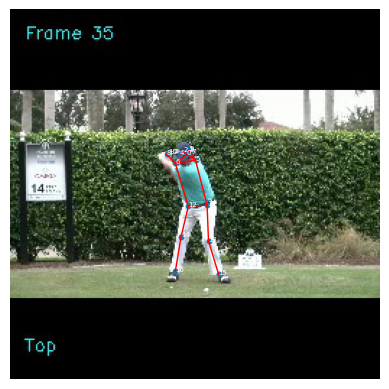

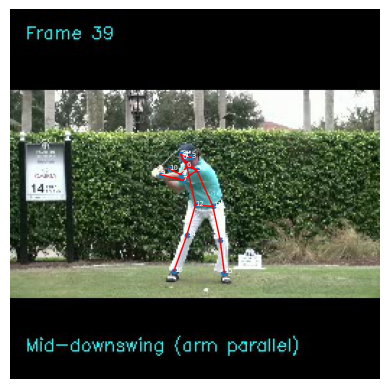

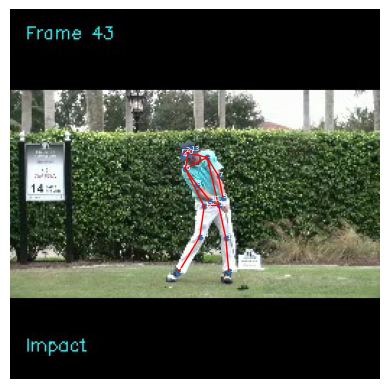

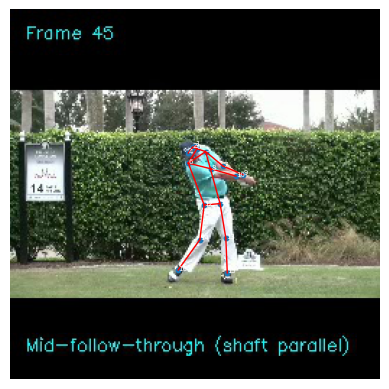

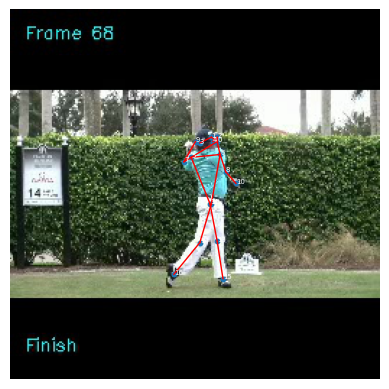

In [8]:
# Create destination folder if it doesn't exist
if not os.path.exists(destination_folder_path_pro):
    os.makedirs(destination_folder_path_pro)

file_list = get_sorted_file_list(folder_with_frames_path_pro)

plot_skeleton(file_list, destination_folder_path_pro, confidence_threshold)

## Plot skeleton: Newbie

Input (Newbie):

In [9]:
destination_folder_path_newbie = "Outputs/skeletons_newbie"

Output (Newbie):

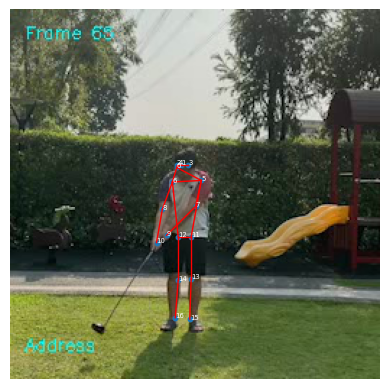

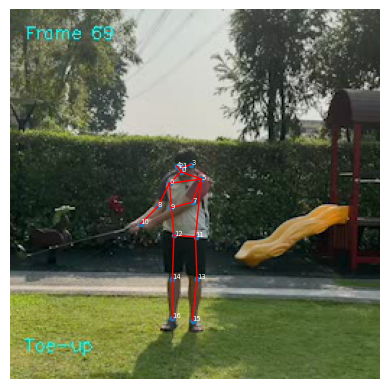

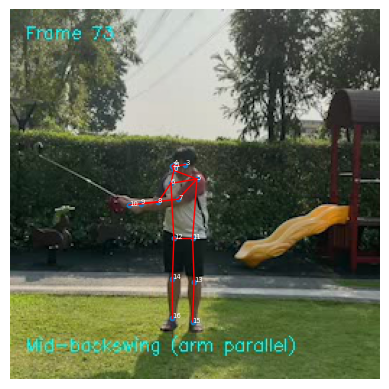

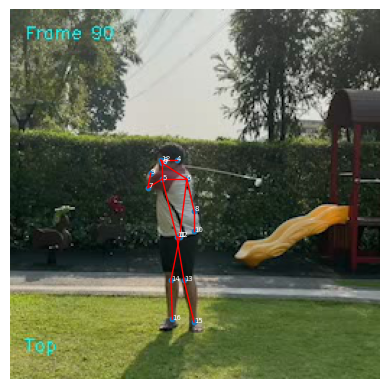

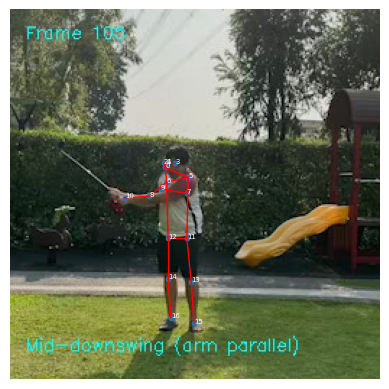

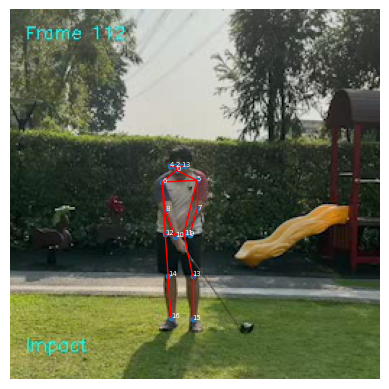

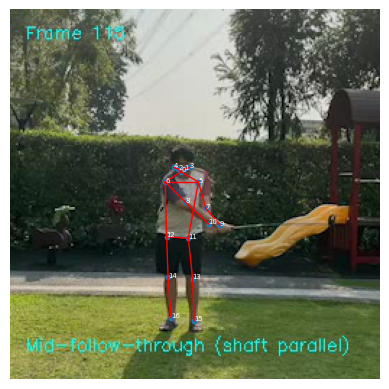

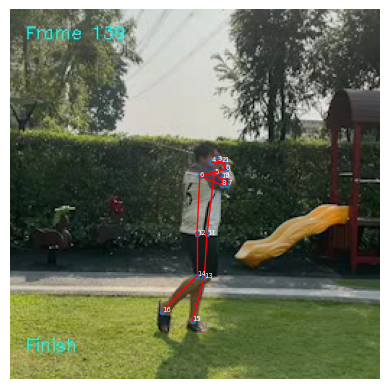

In [10]:
# Create destination folder if it doesn't exist
if not os.path.exists(destination_folder_path_newbie):
    os.makedirs(destination_folder_path_newbie)

file_list = get_sorted_file_list(folder_with_frames_path_newbie)

plot_skeleton(file_list, destination_folder_path_newbie, confidence_threshold)

## Comparison

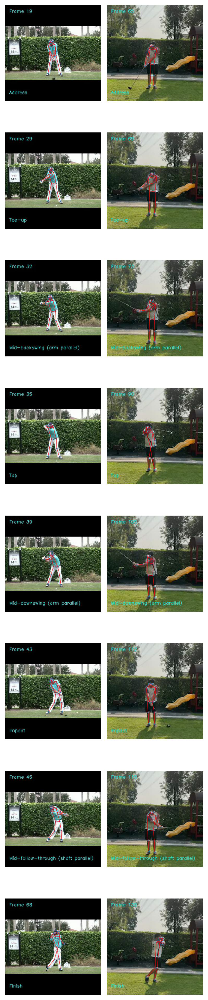

In [11]:
plot_images_from_folders(destination_folder_path_pro, destination_folder_path_newbie)

Show skeleton in video

Warning!: This can crash your computer. (I still don't know why, it always crashes on my Macbook)

Try not to use this function!

In [12]:
path_of_vdo = "Outputs/resized_newbie.mp4"
main_for_vdo(path_of_vdo,confidence_threshold)
# Press "q" to end everything

# 2. Angle and Confidence Values

<img src="./Information/KeyPoint_BodyPart_Angle.png" alt="PNG Image" width="700"/>

Let $k_n$ be the key point (coordinate) corresponding to a body part where $n = 0,1,2,…,16$ (as shown in the table). Each angle number $j$ consists of 3 key points: $z_{j}^{1}, z_{j}^{2}, z_{j}^{3}$ (also shown in the table) where $j = 0,1,2,…,17$. There are only 18 angles because we believe they are important for golf swing. For event $i$, we can compute angle number $j$ by 

$$

a_{i,j}=\cos^{-1} \left[ \frac{\left< \overrightarrow{z^{1}_{j}z^{2}_{j}} , \overrightarrow{z^{1}_{j}z^{3}_{j}} \right>  }{\left\Vert \overrightarrow{z^{1}_{j}z^{2}_{j}} \right\Vert\left\Vert \overrightarrow{z^{1}_{j}z^{3}_{j}} \right\Vert} \right].

$$

There are also confidence values for each key point predicted by MoveNet: $\text{conf}(k_n)$. Since each angle number $j$ (for event $i$) consists of 3 key points, confidence values for each angle can be computed by 

$$

c_{i,j} = \frac{1}{3} \left[  \text{conf}(z^{1}_{j}) + \text{conf}(z^{2}_{j}) + \text{conf}(z^{3}_{j}) \right].

$$

If $i$ = row = event and $j$ = column = angle number, let

Angles: $A := \left[ a_{i,j}\right]_{8\times 18}  ;\  a_{i,j}\in \left[ 0^{\circ},180^{\circ} \right]  $ and

Confidences: $C := \left[ c_{i,j}\right]_{8\times 18}  ;\  c_{i,j}\in \left[ 0,1 \right]$,

then AngleAndConf $:= A \oplus C$, where $\oplus$ is horizontally concatenate matrices operation, is the output of this step (shown below).

<img src="./Information/AngleAndConf.png" alt="PNG Image" width="700"/>


Input (Pro):

In [13]:
output_file_name_pro = "Outputs/AngleAndConf_pro.csv"

Output (Pro):

In [14]:
file_list_pro = get_sorted_file_list(folder_with_frames_path_pro)

frame_arr_pro = get_angle_and_conf(file_list_pro,confidence_threshold)
angle_and_conf_pro = pd.DataFrame(frame_arr_pro)

# Calculate the column-wise mean (ignoring NaN values)
column_means = angle_and_conf_pro.mean(skipna=True).round(2)

# Loop through each column in the DataFrame
for column in angle_and_conf_pro.columns:
    # Check if the column contains NaN values
    if angle_and_conf_pro[column].isna().sum() > 0:
        # Fill NaN values with the column-wise mean
        angle_and_conf_pro[column].fillna(column_means[column], inplace=True)

# Set the new index
angle_and_conf_pro.index = event_names_list

angle_and_conf_pro.to_csv(output_file_name_pro)

angle_and_conf_pro

,0,1,2,3,4,5,6,7,8,9,...,26,27,28,29,30,31,32,33,34,35
Address (0),43.50,52.32,129.72,147.96,82.67,86.14,3.56,9.51,158.44,179.53,...,0.51,0.55,0.58,0.59,0.61,0.58,0.62,0.58,0.64,0.62
Toe-up (1),65.47,51.86,103.37,161.75,84.99,91.46,47.09,54.93,150.01,159.55,...,0.36,0.48,0.59,0.56,0.59,0.60,0.58,0.58,0.58,0.66
Mid-backswing (2),59.04,55.98,63.43,136.55,89.53,90.00,85.14,77.47,161.57,158.63,...,0.32,0.44,0.60,0.60,0.53,0.60,0.58,0.63,0.56,0.69
Top (3),41.82,28.74,25.35,98.13,96.34,81.43,163.51,151.70,175.60,90.00,...,0.31,0.44,0.53,0.56,0.53,0.55,0.61,0.56,0.59,0.66
Mid-downswing (4),15.46,144.16,73.65,115.35,136.95,54.27,78.76,46.22,130.08,97.13,...,0.37,0.35,0.50,0.47,0.54,0.54,0.52,0.55,0.56,0.68
Impact (5),41.07,51.62,134.60,133.67,75.55,91.51,17.98,9.46,159.70,176.74,...,0.45,0.37,0.56,0.55,0.55,0.58,0.57,0.61,0.61,0.60
Mid-follow-through (6),52.13,25.35,158.63,73.07,71.83,102.92,34.67,55.19,163.39,177.65,...,0.41,0.36,0.58,0.59,0.59,0.53,0.66,0.65,0.71,0.64
Finish (7),25.72,83.18,179.53,174.09,73.60,74.28,81.15,28.44,29.29,157.25,...,0.44,0.35,0.47,0.47,0.44,0.47,0.38,0.41,0.42,0.48


Input (Newbie):

In [15]:
output_file_name_newbie = "Outputs/AngleAndConf_newbie.csv"

Output (Newbie):

In [16]:
file_list_newbie = get_sorted_file_list(folder_with_frames_path_newbie)

frame_arr_newbie = get_angle_and_conf(file_list_newbie,confidence_threshold)
angle_and_conf_newbie = pd.DataFrame(frame_arr_newbie)

# Calculate the column-wise mean (ignoring NaN values)
column_means = angle_and_conf_newbie.mean(skipna=True).round(2)

# Loop through each column in the DataFrame
for column in angle_and_conf_newbie.columns:
    # Check if the column contains NaN values
    if angle_and_conf_newbie[column].isna().sum() > 0:
        # Fill NaN values with the column-wise mean
        angle_and_conf_newbie[column].fillna(column_means[column], inplace=True)

# Set the new index
angle_and_conf_newbie.index = event_names_list

angle_and_conf_newbie.to_csv(output_file_name_newbie)

angle_and_conf_newbie

,0,1,2,3,4,5,6,7,8,9,...,26,27,28,29,30,31,32,33,34,35
Address (0),30.76,70.44,105.37,176.47,76.96,86.85,2.35,26.23,147.53,169.64,...,0.34,0.42,0.54,0.52,0.51,0.49,0.51,0.53,0.46,0.48
Toe-up (1),27.42,37.23,89.10,161.57,76.52,93.00,14.85,31.33,125.49,161.57,...,0.37,0.45,0.61,0.59,0.55,0.60,0.60,0.65,0.56,0.61
Mid-backswing (2),30.02,68.01,67.68,157.83,76.35,96.45,38.69,37.71,139.46,130.41,...,0.47,0.38,0.64,0.55,0.61,0.55,0.59,0.63,0.56,0.61
Top (3),90.00,32.91,120.96,135.71,75.96,82.87,73.07,19.93,47.73,167.20,...,0.38,0.35,0.48,0.48,0.48,0.45,0.46,0.42,0.43,0.46
Mid-downswing (4),34.94,84.40,108.43,124.09,77.33,99.84,3.83,51.66,85.73,143.56,...,0.36,0.49,0.62,0.62,0.59,0.63,0.61,0.65,0.55,0.67
Impact (5),28.95,36.27,116.57,122.95,73.94,89.21,13.67,2.53,164.48,164.46,...,0.43,0.38,0.54,0.51,0.58,0.51,0.52,0.53,0.55,0.55
Mid-follow-through (6),30.26,32.47,135.78,77.47,79.82,88.49,25.70,43.49,155.72,178.15,...,0.36,0.40,0.58,0.61,0.58,0.63,0.69,0.70,0.58,0.70
Finish (7),170.75,4.21,62.19,37.33,71.90,104.17,55.16,71.06,29.93,68.20,...,0.35,0.34,0.45,0.42,0.49,0.41,0.52,0.45,0.56,0.49


# 3. Difference, Score and Similarity Score

Differences: $ D := \left[ d_{i,j}\right]_{8\times 18} = \left| A^{\text{pro}} - A^{\text{newbie}} \right|  $

0-1 Scores: $ S := \left[ s_{i,j}\right]_{8\times 18}$, where $s_{i,j}=\begin{cases}1&d_{i,j}<\text{threshold}\\ 0&d_{i,j}\geqslant \text{threshold}\end{cases}  $

Confidences average: $C^{\text{avg}} := \left[ c_{i,j}^{\text{avg}}\right]_{8\times 18} = \frac{1}{2}\left[ C_{\text{pro}} + C_{\text{newbie}} \right]  $

We can now compute a similarity score for event $i$ by

$$ ss_{i}=\frac{\sum^{17}_{j=0} c^{\text{avg}}_{i,j}s_{i,j}}{\sum^{17}_{j=0} c^{\text{avg}}_{i,j}} \times 100\%.  $$

And the overall similarity score (average of all of the events) can be computed by

$$ ss_{\text{overall}}=\frac{1}{8} \sum^{7}_{i=0} ss_{i}. $$

Input:

In [17]:
output_diff_file_name = "Outputs/Difference.csv"
output_score_file_name = "Outputs/Score.csv"
threshold = 10

Output:

In [18]:
angle_pro = angle_and_conf_pro.iloc[:, 0:18].copy()
conf_pro = angle_and_conf_pro.iloc[:, 18:].copy()
angle_newbie = angle_and_conf_newbie.iloc[:, 0:18].copy()
conf_newbie = angle_and_conf_newbie.iloc[:, 18:].copy()
difference_angle = abs(angle_pro - angle_newbie).round(2)
score = difference_angle.copy()
score[score < threshold] = 1
score[score >= threshold] = 0
conf_avg = 0.5*(conf_pro + conf_newbie)

# Set the new index
difference_angle.index = event_names_list
score.index = event_names_list
conf_avg.index = event_names_list

difference_angle.to_csv(output_diff_file_name, index=True, header=True)
score.to_csv(output_score_file_name, index=True, header=True)

In [19]:
difference_angle

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
Address (0),12.74,18.12,24.35,28.51,5.71,0.71,1.21,16.72,10.91,9.89,11.32,6.33,2.05,25.13,9.27,18.80,1.51,1.21
Toe-up (1),38.05,14.63,14.27,0.18,8.47,1.54,32.24,23.60,24.52,2.02,9.23,2.30,2.72,22.36,3.43,20.06,3.43,2.39
Mid-backswing (2),29.02,12.03,4.25,21.28,13.18,6.45,46.45,39.76,22.11,28.22,8.29,1.56,5.19,20.86,9.08,19.30,17.26,1.47
Top (3),48.18,4.17,95.61,37.58,20.38,1.44,90.44,131.77,127.87,77.20,24.11,5.17,7.61,25.91,7.35,29.10,10.53,9.50
Mid-downswing (4),19.48,59.76,34.78,8.74,59.62,45.57,74.93,5.44,44.35,46.43,29.87,15.82,4.41,27.00,11.32,11.18,3.06,0.39
Impact (5),12.12,15.35,18.03,10.72,1.61,2.30,4.31,6.93,4.78,12.28,21.59,17.67,24.00,33.93,5.14,17.79,4.39,22.83
Mid-follow-through (6),21.87,7.12,22.85,4.40,7.99,14.43,8.97,11.70,7.67,0.50,16.69,10.26,10.23,27.36,5.66,18.18,2.94,26.37
Finish (7),145.03,78.97,117.34,136.76,1.70,29.89,25.99,42.62,0.64,89.05,15.32,12.87,8.25,3.64,7.08,16.50,8.98,21.04


In [20]:
conf_avg

,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35
Address (0),0.505,0.505,0.470,0.460,0.550,0.540,0.520,0.505,0.425,0.485,0.560,0.555,0.560,0.535,0.565,0.555,0.550,0.550
Toe-up (1),0.540,0.540,0.475,0.500,0.555,0.585,0.490,0.545,0.365,0.465,0.600,0.575,0.570,0.600,0.590,0.615,0.570,0.635
Mid-backswing (2),0.510,0.510,0.480,0.425,0.560,0.565,0.525,0.480,0.395,0.410,0.620,0.575,0.570,0.575,0.585,0.630,0.560,0.650
Top (3),0.470,0.470,0.390,0.445,0.490,0.515,0.405,0.490,0.345,0.395,0.505,0.520,0.505,0.500,0.535,0.490,0.510,0.560
Mid-downswing (4),0.515,0.515,0.435,0.480,0.540,0.545,0.460,0.505,0.365,0.420,0.560,0.545,0.565,0.585,0.565,0.600,0.555,0.675
Impact (5),0.495,0.495,0.445,0.395,0.550,0.525,0.505,0.430,0.440,0.375,0.550,0.530,0.565,0.545,0.545,0.570,0.580,0.575
Mid-follow-through (6),0.400,0.400,0.380,0.380,0.510,0.485,0.485,0.470,0.385,0.380,0.580,0.600,0.585,0.580,0.675,0.675,0.645,0.670
Finish (7),0.420,0.420,0.385,0.355,0.460,0.470,0.425,0.405,0.395,0.345,0.460,0.445,0.465,0.440,0.450,0.430,0.490,0.485


In [21]:
score

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
Address (0),0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0
Toe-up (1),0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0
Mid-backswing (2),0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0
Top (3),0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0
Mid-downswing (4),0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0
Impact (5),0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
Mid-follow-through (6),0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
Finish (7),0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0


In [22]:
# Initialize a list to store weighted averages
weighted_averages = []

# Loop through each row
for i in range(score.values.shape[0]):
    # Select the ith row from each array
    data_row = score.values[i, :]
    weights_row = conf_avg.values[i, :]
    
    # Compute the weighted sum
    weighted_sum = np.dot(data_row, weights_row)
    
    # Compute the sum of the weights
    sum_of_weights = weights_row.sum()
    
    # Compute the weighted average
    weighted_average = weighted_sum / sum_of_weights
    
    # Append the result to the list
    weighted_averages.append(round(100*weighted_average,2))

print(f"For threshold = {threshold}")
for i in range(len(weighted_averages)):
    print(f"Similarity score for {event_names[i]} = {weighted_averages[i]}%")

average_similarity_score = sum(weighted_averages) / len(weighted_averages)
print(f"Overall similarity score = {round(average_similarity_score,2)}%")

For threshold = 10
Similarity score for Address = 51.89%
Similarity score for Toe-up = 57.51%
Similarity score for Mid-backswing = 42.03%
Similarity score for Top = 36.36%
Similarity score for Mid-downswing = 29.48%
Similarity score for Impact = 39.22%
Similarity score for Mid-follow-through = 41.57%
Similarity score for Finish = 34.86%
Overall similarity score = 41.62%


# 4. Plot specific joint

Define functions:

In [23]:
def match_angle(input_tuple):
    C, A, B = input_tuple
    for index, element in enumerate(angle):
        if element[0] == C and ((element[1] == A and element[2] == B) or (element[1] == B and element[2] == A)):
            return element, index
    else:
        return "Not match", "Not match"


def plot_side_by_side(frame_pro, frame_newbie, event, input_tuple):
    # Read the images and process them
    image1 = plt.imread(frame_pro)
    keypoints_with_scores1, height, width = main(frame_pro, confidence_threshold)
    coor_list1, x1, y1, confidence_list1 = get_coor_list(keypoints_with_scores1, height, width)

    image2 = plt.imread(frame_newbie)
    keypoints_with_scores2, height, width = main(frame_newbie, confidence_threshold)
    coor_list2, x2, y2, confidence_list2 = get_coor_list(keypoints_with_scores2, height, width)

    # Create a figure with 2 subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))

    # Find the joints for that angle
    angle_number_list, angle_index = match_angle(input_tuple)
    print(f"Angle index = {angle_index}, Joints = {angle_number_list}")

    # Plot the first image in the left subplot
    ax1.imshow(image1)
    x_list1 = []
    y_list1 = []
    print
    for n in angle_number_list:
        x_list1.append(x1[n])
        y_list1.append(y1[n])
        ax1.annotate(str(n), (x1[n], y1[n]), color='white', size='8')
    ax1.scatter(x_list1, y_list1)
    for p in range(1, 3):
        ax1.plot([x_list1[0], x_list1[p]], [y_list1[0], y_list1[p]], 'r-')
    ax1.axis('off')
    ax1.set_title(f"{event_names[event]}: Pro")

    # Plot the second image in the right subplot
    ax2.imshow(image2)
    x_list2 = []
    y_list2 = []
    for n in angle_number_list:
        x_list2.append(x2[n])
        y_list2.append(y2[n])
        ax2.annotate(str(n), (x2[n], y2[n]), color='white', size='8')
    ax2.scatter(x_list2, y_list2)
    for p in range(1, 3):
        ax2.plot([x_list2[0], x_list2[p]], [y_list2[0], y_list2[p]], 'r-')
    ax2.axis('off')
    ax2.set_title(f"{event_names[event]}: Newbie: Difference = {difference_angle.iloc[event,angle_index]}°")

    # Adjust layout to prevent overlap
    plt.tight_layout()

    # Show the figure
    plt.show()



Input:

In [24]:
event = 4
joint = [12,11,14]
frame_pro = f"Outputs/8frames_pro/frame_{event}.jpg"
frame_newbie = f"Outputs/8frames_newbie/frame_{event}.jpg"

Output: (Only show some joints for some events)

Angle index = 15, Joints = [12, 11, 14]


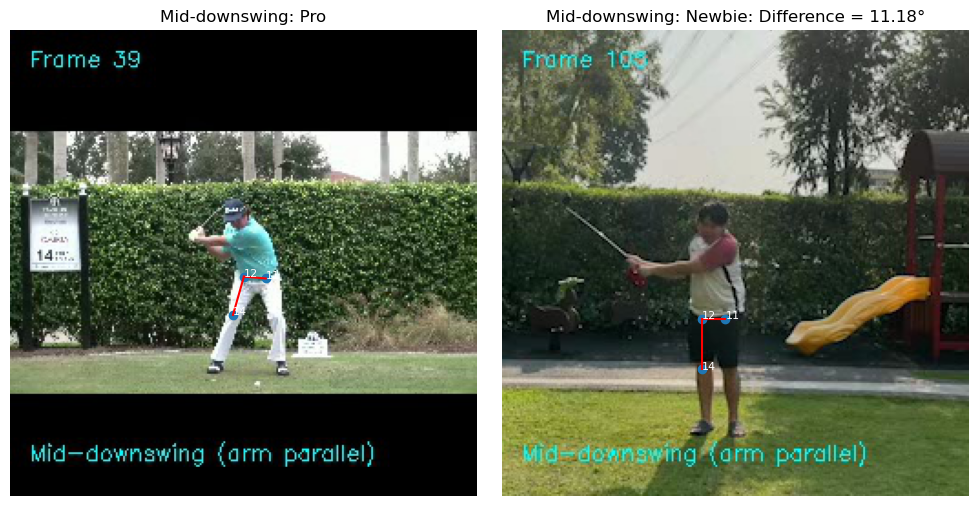

In [25]:
plot_side_by_side(frame_pro, frame_newbie, event, joint)

Angle index = 17, Joints = [14, 12, 16]


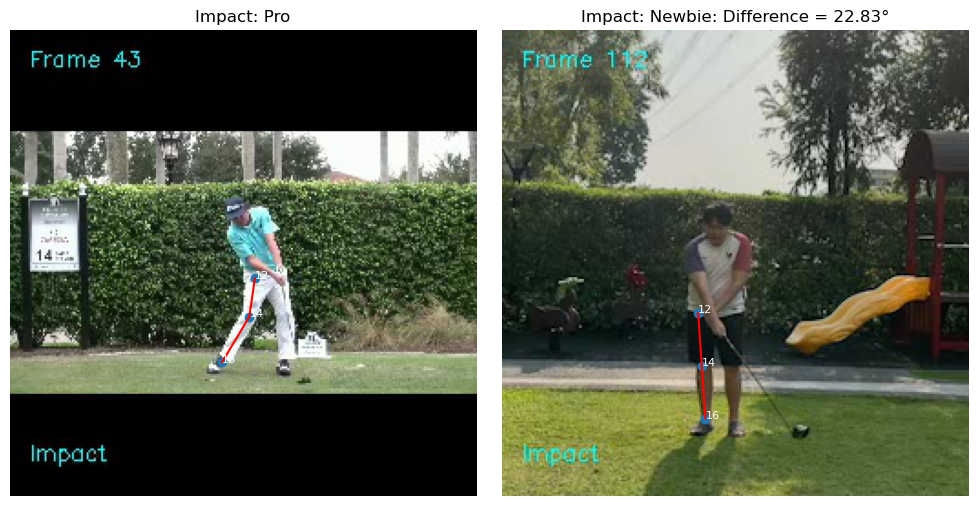

In [26]:
event = 5
joint = [14,12,16]
frame_pro = f"Outputs/8frames_pro/frame_{event}.jpg"
frame_newbie = f"Outputs/8frames_newbie/frame_{event}.jpg"
plot_side_by_side(frame_pro, frame_newbie, event, joint)

Angle index = 13, Joints = [12, 6, 14]


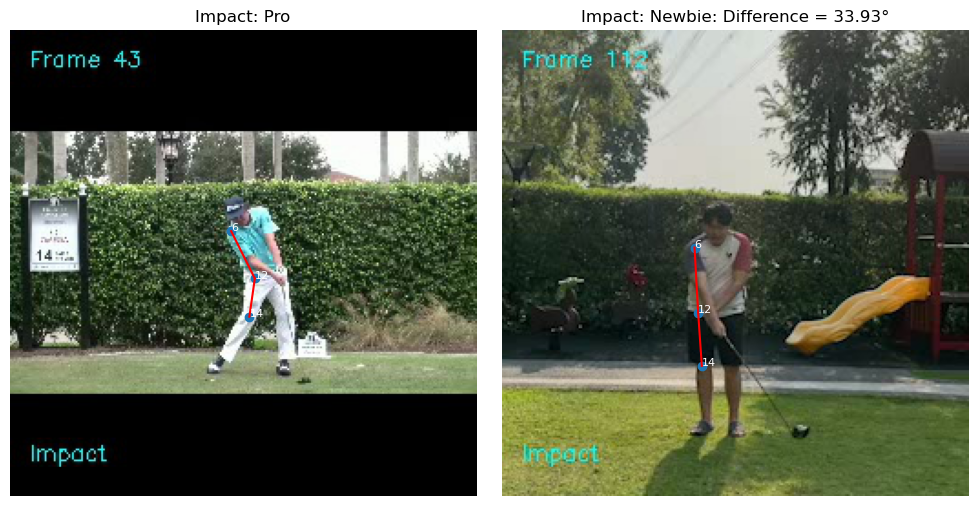

In [29]:
event = 5
joint = angle[13]
frame_pro = f"Outputs/8frames_pro/frame_{event}.jpg"
frame_newbie = f"Outputs/8frames_newbie/frame_{event}.jpg"
plot_side_by_side(frame_pro, frame_newbie, event, joint)

# 5. Cosine Similarity (Bonus)

Pro's angles: $A^{\text{pro}} := \left[ a_{i,j}^{\text{pro}}  \right]_{8\times 18} $

Newbie's angles: $A^{\text{newbie}} := \left[ a_{i,j}^{\text{newbie}}  \right]_{8\times 18} $

We can take each row of $A$ to create vectors:

$\mathbf{a}^{\text{pro}}_{i} =\  \begin{bmatrix}  a_{i,0}^{\text{pro}} &  a_{i,1}^{\text{pro}} & \cdots &  a_{i,17}^{\text{pro}} \end{bmatrix} $ and $\mathbf{a}^{\text{newbie}}_{i} =\  \begin{bmatrix}  a_{i,0}^{\text{newbie}} &  a_{i,1}^{\text{newbie}} & \cdots &  a_{i,17}^{\text{newbie}} \end{bmatrix}. $

A cosine similarity score for event $i$ can be computed by

$$ cs_{i}=\frac{\mathbf{a}^{\text{pro}}_{i} \left[ \mathbf{a}^{\text{newbie}}_{i} \right]^\top  }{\left\Vert \mathbf{a}^{\text{pro}}_{i} \right\Vert \left\Vert \mathbf{a}^{\text{newbie}}_{i} \right\Vert} \times 100\%.  $$

And the overall cosine similarity score (average of all of the events) can be computed by

$$ cs_{\text{overall}}=\frac{1}{8} \sum^{7}_{i=0} cs_{i}. $$

In [28]:
# Compute cosine similarity for each pair of rows
cos_similarities = []

for i in range(len(angle_pro)):
    # Select the ith row from each DataFrame
    sample_A = angle_pro.iloc[i].values.reshape(1, -1)  # Reshape to ensure proper dimensionality
    sample_B = angle_newbie.iloc[i].values.reshape(1, -1)
    # Compute cosine similarity between the two samples
    cosine_sim = cosine_similarity(sample_A, sample_B)
    cos_similarities.append(round(100*cosine_sim[0, 0],2))

for i in range(len(cos_similarities)):
    print(f"Cosine similarity score for {event_names[i]} = {cos_similarities[i]}%")

average_cosime_similarity = sum(cos_similarities) / len(cos_similarities)

print(f"Average cosine similarity score = {round(average_cosime_similarity,2)}%")


Cosine similarity score for Address = 99.32%
Cosine similarity score for Toe-up = 99.02%
Cosine similarity score for Mid-backswing = 98.42%
Cosine similarity score for Top = 87.51%
Cosine similarity score for Mid-downswing = 95.32%
Cosine similarity score for Impact = 99.13%
Cosine similarity score for Mid-follow-through = 99.23%
Cosine similarity score for Finish = 85.21%
Average cosine similarity score = 95.4%


*MoveNet code is modified from:* 


https://www.youtube.com/watch?v=KC7nJtBHBqg,


https://github.com/nicknochnack/MultiPoseMovenetLightning

# **Modified by Karit Sookpreedee (May 2023)**